Assignment by: Yash Jain (yashj133.yj@gmail.com)

###Table of content
>1. [Importing libraries and loading data](#1)
>2. [Preprocess data(removing unwanted cols and managing null values](#2)
>3. [Getting better insight into data using plots and commenting inference for the same](#3)
>4. [Conclusion](#4) 

<a name="1"></a>
importing libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px

loading csv files into dataframes

In [ ]:
df_loan = pd.read_csv('/content/loan.csv')
df_app = pd.read_csv('/content/applicant.csv')

merged both into one single df based on application_id column

In [ ]:
df_merged = pd.merge(df_loan, df_app, on="applicant_id")

In [ ]:
df_merged.head()

,loan_application_id,applicant_id,Months_loan_taken_for,Purpose,Principal_loan_amount,EMI_rate_in_percentage_of_disposable_income,Property,Has_coapplicant,Has_guarantor,Other_EMI_plans,...,Housing,Years_at_current_residence,Employment_status,Has_been_employed_for_at_least,Has_been_employed_for_at_most,Telephone,Foreign_worker,Savings_account_balance,Balance_in_existing_bank_account_(lower_limit_of_bucket),Balance_in_existing_bank_account_(upper_limit_of_bucket)
0,d68d975e-edad-11ea-8761-1d6f9c1ff461,1469590,6,electronic equipment,1169000,4,real estate,0,0,NaN,...,own,4,skilled employee / official,7 years,NaN,Registered under the applicant's name,1,NaN,NaN,0
1,d68d989e-edad-11ea-b1d5-2bcf65006448,1203873,48,electronic equipment,5951000,2,real estate,0,0,NaN,...,own,2,skilled employee / official,1 year,4 years,NaN,1,Low,0,2 lac
2,d68d995c-edad-11ea-814a-1b6716782575,1432761,12,education,2096000,2,real estate,0,0,NaN,...,own,3,unskilled - resident,4 years,7 years,NaN,1,Low,NaN,NaN
3,d68d99fc-edad-11ea-8841-17e8848060ae,1207582,42,FF&E,7882000,2,building society savings agreement/life insurance,0,1,NaN,...,for free,4,skilled employee / official,4 years,7 years,NaN,1,Low,NaN,0
4,d68d9a92-edad-11ea-9f3d-1f8682db006a,1674436,24,new vehicle,4870000,3,NaN,0,0,NaN,...,for free,4,skilled employee / official,1 year,4 years,NaN,1,Low,NaN,0


In [ ]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 27 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   loan_application_id                                       1000 non-null   object
 1   applicant_id                                              1000 non-null   int64 
 2   Months_loan_taken_for                                     1000 non-null   int64 
 3   Purpose                                                   988 non-null    object
 4   Principal_loan_amount                                     1000 non-null   int64 
 5   EMI_rate_in_percentage_of_disposable_income               1000 non-null   int64 
 6   Property                                                  846 non-null    object
 7   Has_coapplicant                                           1000 non-null   int64 
 8   Has_guarantor                

<a name="2"></a>
dropping columns which has high number of null values

In [ ]:
df_merged.drop(columns=["Other_EMI_plans", "Telephone", "Balance_in_existing_bank_account_(lower_limit_of_bucket)", "Balance_in_existing_bank_account_(upper_limit_of_bucket)"], axis=1, inplace=True)

In [ ]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 23 columns):
 #   Column                                       Non-Null Count  Dtype 
---  ------                                       --------------  ----- 
 0   loan_application_id                          1000 non-null   object
 1   applicant_id                                 1000 non-null   int64 
 2   Months_loan_taken_for                        1000 non-null   int64 
 3   Purpose                                      988 non-null    object
 4   Principal_loan_amount                        1000 non-null   int64 
 5   EMI_rate_in_percentage_of_disposable_income  1000 non-null   int64 
 6   Property                                     846 non-null    object
 7   Has_coapplicant                              1000 non-null   int64 
 8   Has_guarantor                                1000 non-null   int64 
 9   Number_of_existing_loans_at_this_bank        1000 non-null   int64 
 10  Loan_history 

In [ ]:
df_merged.describe(include="all")

,loan_application_id,applicant_id,Months_loan_taken_for,Purpose,Principal_loan_amount,EMI_rate_in_percentage_of_disposable_income,Property,Has_coapplicant,Has_guarantor,Number_of_existing_loans_at_this_bank,...,Gender,Marital_status,Number_of_dependents,Housing,Years_at_current_residence,Employment_status,Has_been_employed_for_at_least,Has_been_employed_for_at_most,Foreign_worker,Savings_account_balance
count,1000,1.000000e+03,1000.000000,988,1.000000e+03,1000.000000,846,1000.000000,1000.000000,1000.000000,...,1000,1000,1000.000000,1000,1000.000000,1000,938,747,1000.000000,817
unique,1000,NaN,NaN,9,NaN,NaN,3,NaN,NaN,NaN,...,2,4,NaN,3,NaN,4,4,4,NaN,4
top,d68d975e-edad-11ea-8761-1d6f9c1ff461,NaN,NaN,electronic equipment,NaN,NaN,car or other,NaN,NaN,NaN,...,male,single,NaN,own,NaN,skilled employee / official,1 year,4 years,NaN,Low
freq,1,NaN,NaN,280,NaN,NaN,332,NaN,NaN,NaN,...,690,548,NaN,713,NaN,630,339,339,NaN,603
mean,NaN,1.514763e+06,20.903000,NaN,3.271258e+06,2.973000,NaN,0.041000,0.052000,1.407000,...,NaN,NaN,1.155000,NaN,2.845000,NaN,NaN,NaN,0.963000,NaN
std,NaN,2.286764e+05,12.058814,NaN,2.822737e+06,1.118715,NaN,0.198389,0.222138,0.577654,...,NaN,NaN,0.362086,NaN,1.103718,NaN,NaN,NaN,0.188856,NaN
min,NaN,1.105364e+06,4.000000,NaN,2.500000e+05,1.000000,NaN,0.000000,0.000000,1.000000,...,NaN,NaN,1.000000,NaN,1.000000,NaN,NaN,NaN,0.000000,NaN
25%,NaN,1.321398e+06,12.000000,NaN,1.365500e+06,2.000000,NaN,0.000000,0.000000,1.000000,...,NaN,NaN,1.000000,NaN,2.000000,NaN,NaN,NaN,1.000000,NaN
50%,NaN,1.529114e+06,18.000000,NaN,2.319500e+06,3.000000,NaN,0.000000,0.000000,1.000000,...,NaN,NaN,1.000000,NaN,3.000000,NaN,NaN,NaN,1.000000,NaN
75%,NaN,1.707752e+06,24.000000,NaN,3.972250e+06,4.000000,NaN,0.000000,0.000000,2.000000,...,NaN,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,1.000000,NaN


creating list of categorical columns names

In [ ]:
cat_cols=list(df_merged.select_dtypes(include = 'object').columns)
cat_cols

['loan_application_id',
 'Purpose',
 'Property',
 'Loan_history',
 'Gender',
 'Marital_status',
 'Housing',
 'Employment_status',
 'Has_been_employed_for_at_least',
 'Has_been_employed_for_at_most',
 'Savings_account_balance']

fillna of columns which has categrorical columns using their mode values respectively

In [ ]:
for cat_col in cat_cols:
  df_merged[cat_col].fillna(df_merged[cat_col].value_counts().index[0], inplace=True)

list of columns with continous values

In [ ]:
num_cols=[i for i in df_merged.columns if i not in cat_cols]
num_cols 

['applicant_id',
 'Months_loan_taken_for',
 'Principal_loan_amount',
 'EMI_rate_in_percentage_of_disposable_income',
 'Has_coapplicant',
 'Has_guarantor',
 'Number_of_existing_loans_at_this_bank',
 'high_risk_applicant',
 'Primary_applicant_age_in_years',
 'Number_of_dependents',
 'Years_at_current_residence',
 'Foreign_worker']

fillna for columns with continous values with mean

In [ ]:
for num_col in num_cols:
  df_merged[num_col].fillna(df_merged[num_col].mean(), inplace=True)

In [ ]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 23 columns):
 #   Column                                       Non-Null Count  Dtype 
---  ------                                       --------------  ----- 
 0   loan_application_id                          1000 non-null   object
 1   applicant_id                                 1000 non-null   int64 
 2   Months_loan_taken_for                        1000 non-null   int64 
 3   Purpose                                      1000 non-null   object
 4   Principal_loan_amount                        1000 non-null   int64 
 5   EMI_rate_in_percentage_of_disposable_income  1000 non-null   int64 
 6   Property                                     1000 non-null   object
 7   Has_coapplicant                              1000 non-null   int64 
 8   Has_guarantor                                1000 non-null   int64 
 9   Number_of_existing_loans_at_this_bank        1000 non-null   int64 
 10  Loan_history 

<a name="3"></a>
Gaining more insights to data

In [ ]:
df_merged["high_risk_applicant"].value_counts()

0    700
1    300
Name: high_risk_applicant, dtype: int64

In [ ]:
px.histogram(df_merged, x="high_risk_applicant", color="high_risk_applicant") 

Inference from above plots:
- we see there are 700 records of users who has low credit risk as compared to just 300 records of users with high credit risk.

In [ ]:
px.pie(df_merged, values=df_merged['Purpose'].value_counts().values, names=df_merged['Purpose'].value_counts().index, title="For what purpose do people take loan?")

Inference from above plots:
- we see most users take loan for buying electronic equipments followed by new vehicle, FF&E, used vehicle, buisness etc. 

In [ ]:
#create two seperate df for people with high and low risk
df_risk_0 = df_merged[df_merged['high_risk_applicant']==0]
df_risk_1 = df_merged[df_merged['high_risk_applicant']==1]

In [ ]:
px.pie(df_risk_1, values=df_risk_1['Purpose'].value_counts().values, names=df_risk_1['Purpose'].value_counts().index, title='For what Purpose of loan there are more people with high risk?')

Inference from above plot:
- We infer that loan taken for new car is considered as high risk followed by electronic equipments, FF&E, business etc.

In [ ]:
px.bar(df_merged, y=df_merged['Property'].value_counts().values, x=df_merged['Property'].value_counts().index, title="Properties owned by users")

Inference from above plot:
- Most user in given data have car followed by real estate and building society agreement/life insurance

In [ ]:
px.histogram(df_merged, x="Property", color="high_risk_applicant")

Inference from above plot:
- We infer that user with real estate have probality of 0.212 to be in high risk, people with building society saving agreement/life insurance have probablity of 0.306 to be in high risk and one with car or other has probablity of 0.347 to be in high risk
- people with car or other has highest chance of being in high credit risk followed by building society agreement and real estate

In [ ]:
import plotly.figure_factory as ff
import plotly.offline as py 
import numpy as np

# Add histogram data
x1 = np.log(df_risk_0['Principal_loan_amount']) 
x2 = np.log(df_risk_1["Principal_loan_amount"])

# Group data together
hist_data = [x1, x2]

group_labels = ['Low Risk', 'High Risk']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

# Plot!
py.iplot(fig, filename='Distplot with Multiple Datasets')

Inference from above plot:
- Users having loan amount greater than ~15.3 Lakh fall in high risk and also having loan amount between ~13 Lakh and ~13.8 Lakh falls in high risk zone

In [ ]:
df_merged['Has_coapplicant'].value_counts()

0    959
1     41
Name: Has_coapplicant, dtype: int64

In [ ]:
df_merged['Has_guarantor'].value_counts()

0    948
1     52
Name: Has_guarantor, dtype: int64

Inference:
From above data we can clearly see data is skewed to having no coapplicant and guarantor

Text(0.5, 1.0, 'High risk age distribution')

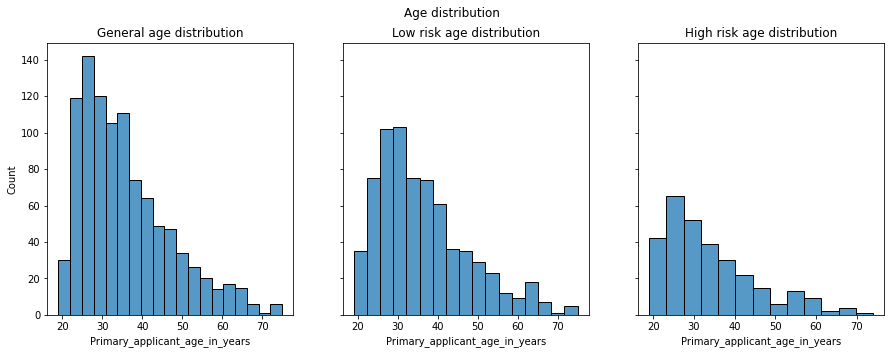

In [ ]:
import seaborn as sns
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
fig.suptitle('Age distribution')

sns.histplot(ax=axes[0], data=df_merged, x='Primary_applicant_age_in_years')
axes[0].set_title('General age distribution')

sns.histplot(ax=axes[1], data=df_risk_0, x='Primary_applicant_age_in_years')
axes[1].set_title('Low risk age distribution')

sns.histplot(ax=axes[2], data=df_risk_1, x='Primary_applicant_age_in_years')
axes[2].set_title('High risk age distribution')

Inference:
- Most user who take loan are in age group of 25-30 which is young people.
- User in age group of 25-30 have low risk whereas users having age below 25 have higher risk, Explained more beriefly below

In [ ]:
interval = (18, 25, 35, 60, 120)
cats = ['Student', 'Young', 'Adult', 'Senior']
df_merged["Age_cat"] = pd.cut(df_merged.Primary_applicant_age_in_years, interval, labels=cats)

In [ ]:
px.histogram(df_merged, x="Age_cat", color="high_risk_applicant", barmode='group')

Inference:
- Probality of Senior people to be in high risk is 0.22
- Probality of Adult people to be in high risk is 0.25
- Probality of Young people to be in high risk is 0.29
- Probality of Student people to be in high risk is 0.42
- Infering that Student have highest chance to be in high risk followed by Young people, Adult and then Senior.

In [ ]:
px.pie(df_merged, values=df_merged['Gender'].value_counts().values, names=df_merged['Gender'].value_counts().index, title="Gender Distribution")

Inference:
- There are 690 male records and 310 female records.

In [ ]:
px.pie(df_risk_1, values=df_risk_1['Gender'].value_counts().values, names=df_risk_1['Gender'].value_counts().index, title="High risk Gender Distribution")

Inference:
- There are high number of male records to be in high risk as compared to female.
- Probablity that male will be in high risk is 0.27
- Probablity that female will be in high risk is 0.35
- It shows that female has higher chance of being in high risk as compared to male.

In [ ]:
df_male = df_merged[df_merged['Gender']=='male']
df_female = df_merged[df_merged['Gender']=='female']

In [ ]:
palette_color_male = sns.color_palette('dark')
palette_color_female = sns.color_palette('bright')
fig = plt.figure(figsize=(12,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((1,2),(0,0))
plt.pie(df_male['Purpose'].value_counts().values, labels=df_male['Purpose'].value_counts().index,colors=palette_color_male, autopct='%.0f%%')
plt.title('Why male take loan?')

#first row sec column
ax1 = plt.subplot2grid((1,2),(0,1))
plt.pie(df_female['Purpose'].value_counts().values, labels=df_female['Purpose'].value_counts().index,colors=palette_color_female, autopct='%.0f%%')
plt.title('Why Female take loan?')

Text(0.5, 1.0, 'Why Female take loan?')

Inference
- We see difference in purpose distribution for male and female users, wherein 16% of male users take loan for FF&E whereas 24% of female users take loan for the same. There are also other differences which can be easily inffered from plot above.

In [ ]:
print(f"Mean Loan amount taken by Male is {int(df_male['Principal_loan_amount'].mean())}")
print(f"Mean Loan amount taken by Female is {int(df_female['Principal_loan_amount'].mean())}")

Mean Loan amount taken by Male is 3448040
Mean Loan amount taken by Female is 2877774


In [ ]:
df_merged['Marital_status'].value_counts()

single                        548
divorced/separated/married    310
married/widowed                92
divorced/separated             50
Name: Marital_status, dtype: int64

Inference: We see skewed data for user's maritial status.

In [ ]:
px.histogram(df_merged, x="Marital_status", color="high_risk_applicant", barmode='group')

Inference:
- Probablity that single people will be in high risk is 0.26
- Probablity that divorced/separated will be in high risk is 0.4
- Probablity that divorced/separated/married will be in high risk is 0.35
- Probablity that married/widowed will be in high risk is 0.27
- Inferencing from above result we observe that divorced/separated have highest risk followed by divorced/separated/married, married/widowed and single.

In [ ]:
px.histogram(df_merged, x="Housing", color="high_risk_applicant", barmode='group')

Inference:
- Probablity that people living in own house will be in high risk is 0.26
- Probablity that people living for free will be in high risk is 0.40
- Probablity that people living in rented house will be in high risk is 0.39
- Infencing from above results we get that people living for free have higher risk follwed by people living in rent and people living in own house.

In [ ]:
px.histogram(df_merged, x="Employment_status", color="high_risk_applicant", barmode='group')

Infernce:
- People who are skilled employee/official to be in high risk have probablity of 0.29
- People who are unskilled - resident to be in high risk have probablity of 0.28
- People who are management/ self-employed/ highly qualified employee/ officer to be in high risk have probablity of 0.34
- People who are unemployed/ unskilled - non resident have to be in high risk have probablity of 0.31
- Inferencing from above results we get people who are employed in management/ self-employed/ highly qualified employee/ officer have high chance of being in high risk followed by unemployed/ unskilled - non resident, skilled employee/official and unskilled - resident.

In [ ]:
px.histogram(df_merged, x="Savings_account_balance", color="high_risk_applicant", barmode='group')

Inference:
- People having low account balance have probablity of 0.31 to be in high risk 
- People having High account balance have probablity of 0.17 to be in high risk
- People having very high account balance have probablity of 0.12 to be in high risk 
- People having medium account balance have probablity of 0.33 to be in high risk
- Inferencing from above results shows that people with medium account balance have high chance to be in high risk followed by low balance, High balance and then very high balance.  

In [ ]:
palette_color_male = sns.color_palette('dark')
palette_color_female = sns.color_palette('bright')

fig = plt.figure(figsize=(12,10), dpi=1600)
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(df_merged[df_merged['Savings_account_balance']=='Low']['Purpose'].value_counts().values, labels=df_merged[df_merged['Savings_account_balance']=='Low']['Purpose'].value_counts().index,colors=palette_color_male, autopct='%.0f%%')
plt.title('Why people with low balance take loan for?')

ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(df_merged[df_merged['Savings_account_balance']=='High']['Purpose'].value_counts().values, labels=df_merged[df_merged['Savings_account_balance']=='High']['Purpose'].value_counts().index,colors=palette_color_female, autopct='%.0f%%')
plt.title('Why people with high balance take loan for?')

ax1 = plt.subplot2grid((2,2),(1,0))
plt.pie(df_merged[df_merged['Savings_account_balance']=='Very high']['Purpose'].value_counts().values, labels=df_merged[df_merged['Savings_account_balance']=='Very high']['Purpose'].value_counts().index,colors=palette_color_male, autopct='%.0f%%')
plt.title('Why people with Very high balance take loan for?')

ax1 = plt.subplot2grid((2,2),(1,1))
plt.pie(df_merged[df_merged['Savings_account_balance']=='Medium']['Purpose'].value_counts().values, labels=df_merged[df_merged['Savings_account_balance']=='Medium']['Purpose'].value_counts().index,colors=palette_color_female, autopct='%.0f%%')
plt.title('Why people with medium balance take loan for?')

Text(0.5, 1.0, 'Why people with medium balance take loan for?')

Inference:
- We could clearly see difference in purpose of loan taken by individuals based on balance in their saving accounts.

In [ ]:
corr_matrix = df_merged.corr()
fig = plt.figure(figsize=(12,10), dpi=1600)
sns.heatmap(corr_matrix, annot=True)

Inference:
- We see months taken loan for has high correlation with being in high risk, so more the months taken loan for means they will be in high risk.
- Same goes for principal loan amount. More the principal loan amount more the risk.

<a name="4"></a>
# Conclusion:
- Factors having high probablity to be in high risk zone are:
>- Gender : Female
>- Age group : Student (18-22)
>- Purpose: new car
>- Loan amount : Greater than ~15.3 Lakh and also between ~13 Lakh and ~13.8 Lakh
>- Greater the period of loan more chances to be in high risk
>- Account balance : Medium
>- Employement status : management/ self-employed/ highly qualified employee/ officer
>- Housing : For free
>- Maritial status : divorced/separated 
>- Mean Loan amount taken by Male : 3448040
>- Mean Loan amount taken by Female : 2877774
>- Property: car or other


Task 2: https://colab.research.google.com/drive/1wMKWfjxsTClA6iD2smqpan1t7z-feLe7?usp=sharing